<a href="https://colab.research.google.com/github/Fibonacci1664/Pix2Pix/blob/main/Sketch_to_Art_Model_Fin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMPORTS, VERSIONS, AND DEVICES**

In [29]:
import tensorflow as tf

import os
import pathlib
import time
import datetime
import numpy as np
import sys
import csv

from matplotlib import pyplot as plt
from IPython import display
from google.colab import files

import keras.utils as image
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras.layers import AveragePooling2D
from keras.layers import GlobalAveragePooling2D
from keras.layers import MaxPooling2D
from keras.utils.vis_utils import plot_model
from keras.layers import Conv2DTranspose
from keras.layers import Dropout
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.metrics import Mean

# If using Google Drive to load datasets or save data to etc, uncomment this
# Also you will need to uncomment code in the TRAINING header
# from google.colab import drive
# drive.mount('/content/drive')

print(tf.__version__)
print(sys.version)
!nvidia-smi

physical_devices = tf.config.list_physical_devices('GPU')

if len(physical_devices) > 0:
    for device in physical_devices:
        print("Name:", device.name)
        print("Type:", device.device_type)
else:
    print("No GPU available.")

2.12.0
3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]
Mon May  8 09:48:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    25W /  70W |   9563MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                               

# **LOAD SKETCH2POKEMON DATASET**

(256, 512, 3)


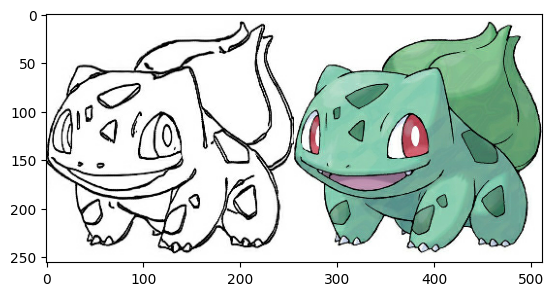

In [30]:
input_file = '/content'

PATH = input_file

# Each original image is of size 256 x 512, which in and of itself contains two 256 x 256 images
# Print out a sample image to ensure the dataset has loaded correctly
sample_image = tf.io.read_file(str(PATH+'/train/0.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

plt.figure()
plt.imshow(sample_image)

# **PREPROCESS DATA**

### **SPLIT IMAGES INTO TWO SEPARATE IMAGES, REAL/LABEL or TARGET/INPUT**

(256, 256, 3)


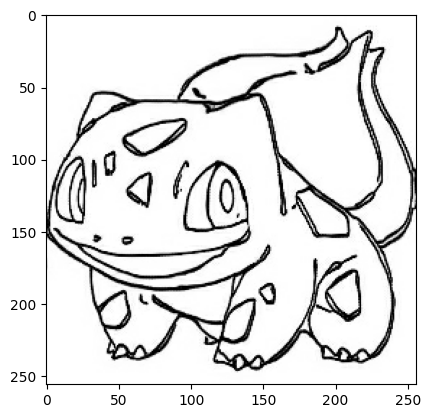

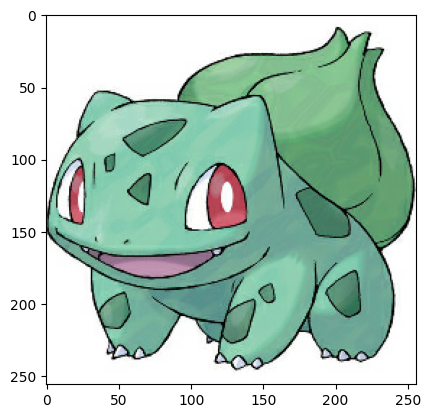

In [31]:
# Define a function that loads image files and outputs two image tensors, these two images will be the 256 x 512 separated

# Image file is Python object
def load(image_file):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)     # Tensor
    image = tf.io.decode_jpeg(image)

    # Split each image tensor into two tensors:
    # - one with the sketch image
    # - one with the real image
    w = tf.shape(image)[1]                # 512                 # Tensor
    w = w // 2                            # 256
    sketch_image = image[:, :w, :]        # From start - 256    # Tensor
    real_image = image[:, w:, :]          # From 256 - end      # Tensor

    # Convert both images to float32 tensors
    sketch_image = tf.cast(sketch_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    # print("sketch_image shape: ", sketch_image.shape)
    # print("real_image shape: ", real_image.shape)

    return sketch_image, real_image

# Plot a sample of the input (sketch image) and real images
sketch, real = load(str(PATH+'/train/0.jpg'))                   # Tensors

print(sketch.shape)

# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(sketch / 255.0)
plt.figure()
plt.imshow(real / 255.0)

### **HELPER FUNCTIONS TO AUGMENT DATA**

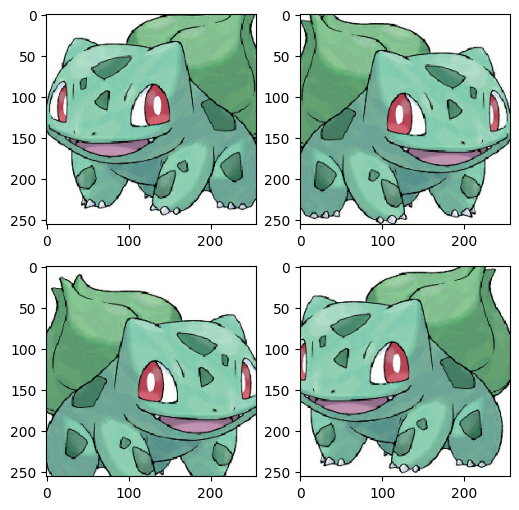

In [32]:
# As described in the pix2pix paper, apply random jittering and mirroring to preprocess the training set.

# Define several functions that:

# Resize each 256 x 256 image to a larger height and width, 286 x 286.
# Randomly crop it back to 256 x 256.
# Randomly flip the image horizontally i.e. left to right (random mirroring).
# Normalize the images to the [-1, 1] range.

# The pokemon train set has 664 images
BUFFER_SIZE = 664
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1] using scaling normalization
def normalize_two(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

# Normalizing the image to [-1, 1] using scaling normalization
def normalize_one(input_image):
    input_image = (input_image / 127.5) - 1
    return input_image

# Normalizing the images to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
# Something is not quite right with this as it's causing streaking type artefact across the generated images
def normalize_channel_wise_two(input_image, real_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std
    real_image = (real_image - mean) / std
    
    return input_image, real_image

# Normalizing a single image to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
def normalize_channel_wise_one(input_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std 
    
    return input_image

def random_jitter(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image) 

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

# Inspect some of the preprocessed output
plt.figure(figsize=(6, 6))

for i in range(4):
    rand_jit_sketch, rand_jit_real = random_jitter(sketch, real)
    plt.subplot(2, 2, i + 1)
    #plt.imshow(rand_jit_sketch / 255.0)
    plt.imshow(rand_jit_real / 255.0)
    plt.axis('on')

plt.show()

### **HELPER FUNCTIONS THAT LOAD AND PREPROCESS THE TRAIN/TEST SETS**

In [33]:
# Helper functions that load and preprocess the training and test sets
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image # Tensors

def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image # Tensors

# **BUILD INPUT PIPELINE**

In [34]:
# Build an input pipeline with tf.data
train_dataset = tf.data.Dataset.list_files(str(PATH+'/train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

#print("Total number of samples:", train_dataset.cardinality().numpy())

try:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/test/*.jpg'))
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/val/*.jpg'))

test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# **DUAL MASK INJECTION**

In [35]:
def dual_mask_injection(feat, mask, in_channels):

    # Declare trainable weights and biases for "value relocation"
    # when combined with contour and plain area features

    # Initialized with a non 1 and non 0 values to break symmetry and prevent
    # the network learning the same features each iteration
    weight_c = tf.Variable(tf.ones((1, 1, 1, in_channels))*1.1)
    weight_p = tf.Variable(tf.ones((1, 1, 1, in_channels))*0.9)

    bias_c = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)
    bias_p = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)

    feat_c = weight_c * (feat * mask) + bias_c
    feat_p = weight_p * (feat * (1-mask)) + bias_p

    final_tensor = feat_c + feat_p

    return final_tensor

# **FEATURE MAP TRANSFORMATION**

In [36]:
# Step 1:
# Get the Contour features (C) and Plain-area feature (P)
# Use the style-image's sketch as a mask (M), so we can filter the values in the style-image's feature maps (F)
# With (M*F): (element-wise), we can get a feature-map (FM_C), that only have the feature values of the contours, 
# and with (1-M)*F: (element-wise), we can get the (FM_P) with features only around the plain areas of the image.

# Step 2:
# Then we use a max-pooling layer to extract the filtered feature values, because the filtered feature-map will be sparse
# Finally, we will have two 4x4 feature-maps, one for the edge and one for the rest.

# Step 3:
# Then we impose the features into the content feature map. To begin with, we fill a blank feature-map with same size 
# of the content feature-map with the Edge feature-map.

# Step 4:
# Then we use the content-sketch as mask to filter this feature map.
# Do the same thing with Plain feature-map.

# Step 5:
# Then we can add the 2 feature-maps into one.

def FeatMapTransfer(style_feat, style_skt_feat, content_skt_feat, hw=8):

    ######### STEP 1 #########
    # Downsample by averaging all values in the pool size window, this is the resulting value
    # Stride move 1 pixel at a time
    # valid = No padding applied
    style_skt = AveragePooling2D(pool_size=hw, strides=1, padding="valid")(style_skt_feat)
    content_skt = AveragePooling2D(pool_size=hw, strides=1, padding="valid")(content_skt_feat)

    # Use the style features as a mask to extract the content(edge) and plain areas
    contour_feat = style_feat * style_skt
    plain_feat = style_feat * (1-style_skt)

    ######### STEP 2 CONTOUR AREA #########
    # Downsample by max pooling to reduce to a contour feature map of 4x4
    # Find the max value within the pool size window, this is the resulting value
    # Moving 2 pixels at a time
    # same = add enough padding such that the output tensor has the same spatial dims as the input
    contour_feat = MaxPooling2D(pool_size=(4, 4), strides=(2, 2), padding='same')(contour_feat)
    contour_feat = MaxPooling2D(pool_size=(4, 4), strides=(1, 1), padding='same')(contour_feat)
    contour_feat = AveragePooling2D(pool_size=(1, 1), strides=(1, 1), padding='valid')(contour_feat)

    ######### STEP 2 PLAIN AREA #########
    # Max pooling is carried out to reduce plain area feature map to a 4x4
    plain_feat = MaxPooling2D(pool_size=(4, 4), strides=(2, 2), padding='same')(plain_feat)
    plain_feat = MaxPooling2D(pool_size=(4, 4), strides=(1, 1), padding='same')(plain_feat)
    plain_feat = AveragePooling2D(pool_size=(1, 1), strides=(1, 1), padding='valid')(plain_feat)

    ######### STEP 3 CONTENT AREA #########
    # Tile contour feature map to match the shape of the sketch image
    contour_feat = tf.tile(contour_feat, [1, 4, 6, 1])

    # Tile plain area feature map to match the shape of the sketch image
    ######### STEP 3 PLAIN AREA #########
    plain_feat = tf.tile(plain_feat, [1, 4, 6, 1])

    ######### STEPS 4 & 5 #########
    final_tensor = (contour_feat*content_skt) + (plain_feat*(1-content_skt))

    return final_tensor

# **VGG-16 MODEL**

In [37]:
# Create an instance of the VGG-16 model
vgg_model = VGG16(weights='imagenet', include_top=False)

#vgg_model.summary()

# **AdaIn**

In [38]:
# https://github.com/jonrei/tf-AdaIN/blob/master/AdaIN.py

def AdaIN(content_features, style_features, alpha):
    '''
    Normalizes the `content_features` with scaling and offset from `style_features`.
    See "5. Adaptive Instance Normalization" in https://arxiv.org/abs/1703.06868 for details.
    '''
    # Calculate the mean and variance of the style image, reducing over dimensions [1, 2]
    style_mean, style_variance = tf.nn.moments(style_features, [1,2], keepdims=True)

    # Calculate the mean and variance of the content image, reducing over dimensions [1, 2]
    content_mean, content_variance = tf.nn.moments(content_features, [1,2], keepdims=True)

    # Prevent division by zero
    epsilon = 1e-5

    normalized_content_features = tf.nn.batch_normalization(content_features, content_mean,
                                                            content_variance, style_mean, 
                                                            tf.sqrt(style_variance), epsilon)
    
    # Lerp between the norm content features and the content features using the alpha value to control
    normalized_content_features = alpha * normalized_content_features + (1 - alpha) * content_features

    return normalized_content_features

# **U-NET GENERATOR MODEL**

### **HELPER FUNCTION TO DEFINE AN ENCODER BLOCK** 

In [39]:
# Define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):

	# Weight initialization
	# params, mean = 0, stddev = 0.02
	# mean = 0 for symmetry breaking
	# stddev = 0.02 keep the initialization values small, trying to prevent numerical issues
	init = tf.random_normal_initializer(0., 0.02)
	# Downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
 
	# Conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)

	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
 
	return g # Tensor

### **HELPER FUNCTION TO DEFINE AN DECODER BLOCK**

In [40]:
# Define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):

	# weight initialization
	init = tf.random_normal_initializer(0., 0.02)
	# Upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
	# Batch normalization
	g = BatchNormalization()(g, training=True)
 
	# Conditionally add dropout
	if dropout:
		# 50% chance of being dropped out of training
		g = Dropout(0.5)(g, training=True)
  
	# Concat skip connection
	g = Concatenate()([g, skip_in])
 
	# ReLU activation
	g = Activation('relu')(g)

	return g # Tensor

### **LOAD STYLE IMAGES** 

In [41]:
OUTPUT_CHANNELS = 3

# Load the style image
img_path = 'starry_night_256.jpg'
style_image = image.load_img(img_path, target_size=(256, 256))
style_image = image.img_to_array(style_image)

# Normalize the style image
style_image = tf.cast(style_image, tf.float32)
style_image = normalize_one(style_image)

# Expand the first dim so that the style image tensor is rank 4 for vgg
style_image = tf.expand_dims(style_image, axis=0)
style_image = preprocess_input(style_image)

# Load the style image sketch
img_path = 'starry_night_256_sketch.jpg'
style_image_sketch = image.load_img(img_path, target_size=(256, 256))
style_image_sketch = image.img_to_array(style_image_sketch)

# Normalize the style image sketch
style_image_sketch = tf.cast(style_image_sketch, tf.float32)
style_image_sketch = normalize_one(style_image_sketch)

# Expand the first dim so that the style image tensor is rank 4 for vgg
style_image_sketch = tf.expand_dims(style_image_sketch, axis=0)
style_image_sketch = preprocess_input(style_image_sketch)

### **GENERATOR MODEL - U-NET**

The generator model for Pix2Pix is implemented as a U-Net.

[Insert own diagram of U-Net with dims included]

Encoder: C64-C128-C256-C512-C512-C512-C512-C512

Decoder: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128

In [42]:
# Get the style feature map we'll need for FMT and AdaIn, and the loss functions
# Declared in a global scope and updated in the following function
# Global scope due to being used during training

style_feature_map = vgg_model(style_image) # Tensor

In [43]:
# U-Net encoder-decoder generator model

def define_generator(image_shape=(256,256,3)):

	init = tf.random_normal_initializer(0., 0.02)
	in_image = Input(shape=image_shape)
	#print("in_image shape: ", in_image.shape)
	#print("in_image values: ", in_image)

	# Encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
 
	# Bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
 
	# Decoder model: CD1024-CD1024-CD1024-C1024-C512-C256-C128-C3
	d1 = decoder_block(b, e7, 512)

	# Extract style feature map used in DMI, AdaIn, and the FMT
	style_feature_map = vgg_model(style_image)

	############################################################## IMPLEMENTING DMI ##############################################################
	
	binary_mask = tf.where(in_image != 0, 1.0, 0.0)
 
	############################################################## DOWNSAMPLE BINARY MASK ########################################################
	# Downsample bin mask to same shape as the style features for use in the DMI

	# Downsample using convolution layers
	mask = Conv2D(filters=64, kernel_size=3, strides=2, padding='same')(binary_mask)
	mask = Conv2D(filters=128, kernel_size=3, strides=2, padding='same')(mask)
	mask = Conv2D(filters=256, kernel_size=3, strides=2, padding='same')(mask)
	mask = Conv2D(filters=512, kernel_size=3, strides=2, padding='same')(mask)

	# Downsample further using pooling layers to extract most prominent features
	mask = tf.keras.layers.MaxPooling2D(pool_size=2, strides=2)(mask)

	# functions params:
	# feat = style image feature map
	# mask = binary mask of the sketch input
	# in_channels = number of channels
	DMI_tensor = dual_mask_injection(style_feature_map, mask, 512)

	# Ensure DMI tensor is of same datatype as what we want to concatenate with
	DMI_tensor = tf.cast(DMI_tensor, tf.float32)

	############################################################## IMPLEMENTING DMI END ##########################################################

	############################################################## IMPLEMENTING ADAIN ############################################################

	# Pass both the content feature map and style feature map to AdaIn function
	adaIn_feature_map = AdaIN(b, style_feature_map, 0.5)

	############################################################## IMPLEMENTING ADAIN END ########################################################

	############################################################## IMPLEMENTING FEATURE MAP TRANSFORMATION #######################################

	# Create specific vgg model for use with FMT, outputting at block4_pool from VGG
	FMT_model = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer('block4_pool').output)
 
	# Get the style sketch feature map
	style_sketch_feature_map = vgg_model(style_image_sketch)

	# Carry out FMT
	fmt_output = FeatMapTransfer(style_feature_map, style_sketch_feature_map, e5)

	# Reshape the combined feature maps
	fmt_output_reshape = tf.reshape(fmt_output, (1, 256, 256, 3))

	# Pass this new feature map through the VGG network for final extracted feature map
	FMT_block4_pool_features = FMT_model(fmt_output_reshape)

	############################################################## IMPLEMENTING FEATURE MAP TRANSFORMATION END ###################################

	d2 = decoder_block(d1, e6, 512)
 
	adain_feature_map_reshaped = tf.reshape(adaIn_feature_map, shape=(-1, 512))
	adain_feature_map_repeated = tf.repeat(adain_feature_map_reshaped, repeats=4*4, axis=0)
	adain_feature_map_repeated_reshaped = tf.reshape(adain_feature_map_repeated, shape=(-1, 4, 4, 512))
 
	# Concatenate the adain feature map with d2 along the channel dimension
	concatAdain_d2 = tf.concat([adain_feature_map_repeated_reshaped, d2], axis=-1)

	d3 = decoder_block(concatAdain_d2, e5, 512)
 
	concatDMI_d3 = tf.concat([DMI_tensor, d3], axis=-1)

	d4 = decoder_block(concatDMI_d3, e4, 512, dropout=False)

	# Concat FMT_block_pool_features with d4
	concat_FMT_d4 = tf.concat([FMT_block4_pool_features, d4], axis=-1)
 
	d5 = decoder_block(concat_FMT_d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
 
	# Output
	g = Conv2DTranspose(OUTPUT_CHANNELS, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)

	out_image = Activation('tanh')(g)
 
	# Define model
	model = Model(in_image, out_image)
 
	return model

# Define image shape
image_shape = (256,256,3)

# Create the model
gen_model = define_generator()

# Summarize the model
#gen_model.summary()
# Plot the model
#plot_model(gen_model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)

# **TEST THE GENERATOR**

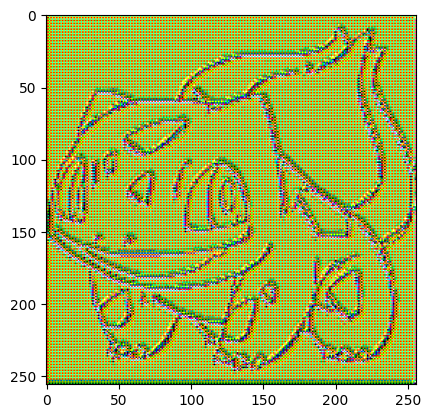

In [44]:
# By the time we get here we MUST have shape(1, 256, 256, 3), even after all the DMI, FMT, and AdaIn from the VGG

# TEST THE GENERATOR
gen_model_output = gen_model(sketch[tf.newaxis, ...], training=False)
#gen_model_output = tf.squeeze(gen_model_output, axis=0)
#print(gen_model_output)

plt.imshow(gen_model_output[0, ...])

# **DEFINE GENERATOR LOSS**

### **UPDATED GENERATOR LOSS FUNCTION**

In [45]:
# GANs learn a loss that adapts to the data, while cGANs learn a structured loss
# that penalizes a possible structure that differs from the network output and the target image, as described in the pix2pix paper.

# The generator loss is a sigmoid cross-entropy loss of the generated images and an array of ones.
# The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
# This allows the generated image to become structurally similar to the target image.
# The formula to calculate the total generator loss is gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. This value was decided by the authors of the paper.

# L(G) = E[log(P(G(Isketch, Istyle)))] + MSE(C(G(Isketch, Istyle)), Isketch) + MSE(S(G(Isketch, Istyle)), E(Istyle)).

# Controls the importance of the L1 term which in turn controls the pixel-wise difference
# Increasing this value will give the L1 more importance, decreasing will have the opposite effect
LAMBDA = 100

binCrossEnt = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def updated_generator_loss(disc_generated_output, gen_output, target, original_sketch, idn_predicted_sketch, idn_predicted_style):

    # E[log(P(G(Isketch, Istyle)))]
    # Comparison between the generated output and a tensor of 1's, i.e. target labels of Real
    # Encourages generator to produce outputs that are classified as real
    gan_loss = binCrossEnt(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error MAE, for enforcing perceptual loss, i.e. encourage generator to produce outputs
    # that are perceptually similar to the ground truth, measures the pixel-wise diff between the Gen output and ground truth.
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    idn_predicted_sketch = tf.reshape(idn_predicted_sketch, [1, 1, 256, 1])

    # MSE(C(G(Isketch, Istyle)), Isketch)
    # This loss encourages the generator to produce outputs that are similar to the input sketch
    content_loss = tf.keras.losses.MeanSquaredError()(idn_predicted_sketch, original_sketch) # [1, 1, 256, 1] & [1, 256, 256, 3]

    # Reshape to allow loss calculation
    style_feat_map_reshape = tf.reshape(style_feature_map, [1, 8, 16, 256])

    # MSE(S(G(Isketch, Istyle)), E(Istyle)) - The difference between predcited style vector of the generated image and the style feature map extracted by VGG
    # Encourages the generator to produce outputs that have similar style to the ground truth style image
    style_loss = tf.keras.losses.MeanSquaredError()(idn_predicted_style, style_feat_map_reshape) # [1, 256] & [1, 8, 16, 256]
    
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + content_loss + style_loss

    return total_gen_loss, gan_loss, l1_loss, content_loss, style_loss

# **INSTANCE DE-NORMALIZATION**

In [46]:
def idn(input_image, in_channel, style_dim, content_channel=1):

    # Take a tensor as input, predict out the:
    # 1. grey-scale sketch image
    # 2. style feature vector
    # input_image = (1, 16, 16, 1) -> (b, h, w, c) - The output from the Disc

    # Define the style_mu_conv layer to predict the mean of the input image
    style_mu_conv = tf.keras.Sequential([
        Conv2D(in_channel, kernel_size=4, strides=2, padding='same'),
        LeakyReLU(alpha=0.1),
        Conv2D(in_channel, kernel_size=4, strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        GlobalAveragePooling2D()])      # Reduces to a (1,1)

    # Define the to_style layer
    to_style = tf.keras.layers.Dense(style_dim)

    # Define the to_content layer
    to_content = tf.keras.Sequential([
        Conv2D(in_channel, kernel_size=2, strides=1, padding='same'),
        LeakyReLU(alpha=0.1),
        Conv2D(content_channel, kernel_size=2, strides=1, padding='same'),
        LeakyReLU(alpha=0.2),
        AveragePooling2D(pool_size=1)])      # Reduces to a (1, 1, 256, 1)

    # Compute style_mu (mean value)
    style_mu = style_mu_conv(input_image) # (1, 1)

    # Compute style_sigma (variance value), subtract mean from input tensor values - element wise
    feat_no_style_mu = input_image - style_mu # (1, 16, 16, 1) -> (b, h, w, c)
    feat_no_style_mu = tf.reshape(feat_no_style_mu, (tf.shape(input_image)[0], -1, tf.shape(input_image)[3])) # (1, 256, 1)

    # Computes the standard deviation of all elements across dims of tensor, i.e. variance
    style_sigma = tf.math.reduce_std(feat_no_style_mu, axis=1)
    
    # Compute feat_content - Normalise feat_no_style_mu using the styles standard deviation
    # Normalises the pixel values by the corresponding style SD for each channel
    # This represents the features that are preserved from the original image, not affected by the style TF
    # This step here represents equ [5] from the paper
    feat_content = feat_no_style_mu / tf.reshape(style_sigma, (tf.shape(input_image)[0], 1, 1, tf.shape(feat_no_style_mu)[2])) # (1, 1, 256, 1)
    
    # Compute style vector
    # Reshapes both input image and style_sigma to batchsize, and infer remaining dims,
    # then concat along channel axis, for final shape (batch_size, 16*16)
    style = to_style(tf.concat([tf.reshape(style_mu, (tf.shape(input_image)[0], -1)), tf.reshape(style_sigma, (tf.shape(input_image)[0], -1))], axis=1))

    # Compute content
    content = to_content(feat_content)

    # Reshape content to (1, 16, 16, 1) as per the paper, the content should have spatial dimension AFTER conv of 16x16
    # This is used when predicting for the Gen loss function
    if(in_channel == 1):
        content = tf.reshape(content, [1, 16, 16, 1])
    
    return content, style

# **HELPER FUNCTION TO CALCULATE THE RECEPTIVE FIELD SIZE**

In [47]:
# Calculating the receptive field for the PatchGAN

# Calculate the effective receptive field size
def receptive_field(output_size, kernel_size, stride_size):
    return (output_size - 1) * stride_size + kernel_size

# output layer 1x1 pixel with 4x4 kernel and 1x1 stride
rf = receptive_field(1, 4, 1)
print(rf)
# second last layer with 4x4 kernel and 1x1 stride
rf = receptive_field(rf, 4, 1)
print(rf)
# 3 PatchGAN layers with 4x4 kernel and 2x2 stride
rf = receptive_field(rf, 4, 2)
print(rf)
rf = receptive_field(rf, 4, 2)
print(rf)
rf = receptive_field(rf, 4, 2)
print(rf)

4
7
16
34
70


# **PATCH GAN DISCRIMINATOR MODEL**

In [48]:
# A PatchGAN discriminator model

# Define the discriminator model
def define_discriminator(image_shape):

	# Weight initialization
	init = tf.random_normal_initializer(0., 0.02)
	# Source image input
	in_src_image = Input(shape=image_shape)
	# Target image input
	in_target_image = Input(shape=image_shape)
	# Concatenate images channel-wise to allow the comparison of the two images
	merged = Concatenate()([in_src_image, in_target_image])

	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)

	#zero_pad1 = tf.keras.layers.ZeroPadding2D()(d)

	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)

	# C512
	d = Conv2D(512, (4,4), strides=(1,1), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)

	#zero_pad2 = tf.keras.layers.ZeroPadding2D()(d)

	d = Conv2D(1, (4,4), strides=1, padding='same', kernel_initializer=init)(d)

	#print("d shape: ", d.shape)
	# No activation as the loss function BinCrossEnt has logits=true

	#patch_out = Activation('sigmoid')(d)

	#print("d shape: ", d.shape)

	# define model
	model = Model([in_src_image, in_target_image], d)

	return model

# define image shape
image_shape = (256,256,3)
# create the model
disc_model = define_discriminator(image_shape)
# summarize the model
#disc_model.summary()
# plot the model
#plot_model(disc_model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)


# **TEST THE DISCRIMINATOR**

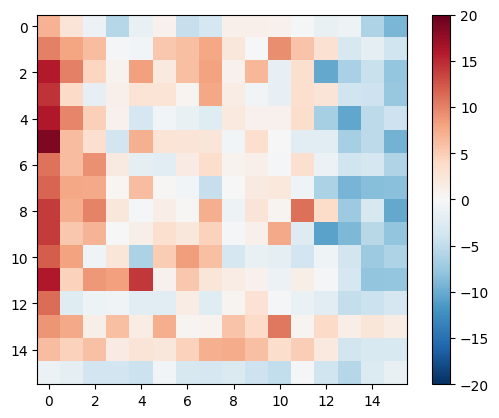

In [49]:
# TEST THE DISCRIMINATOR
disc_output = disc_model([sketch[tf.newaxis, ...], gen_model_output], training=False)
plt.imshow(disc_output[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

# **DEFINE DISCRIMINATOR LOSS**

### **UPDATED DISCRIMINATOR LOSS FUNCTION**

In [50]:
# target = real / ground truth image

# L(D) = E[log(P(Ireal))] + E[log(1 − P(G(Isketch, Istyle)))] + MSE(S(Ireal), E(Ireal)) + MSE(C(Ireal), Ireal−sketch)

binCrossEnt = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def updated_discriminator_loss(disc_real_output, disc_generated_output, ground_truth_feature_map, original_sketch, predicted_style_real, predicted_sketch_real):
    
    # E[log(P(Ireal))], target labels of 1, exptected value that the disc will classify real images as real
    real_loss = binCrossEnt(tf.ones_like(disc_real_output), disc_real_output)

    # E[log(1 − P(G(Isketch, Istyle)))], target labels of 0, expected value that the disc will classify fake images as fake
    generated_loss = binCrossEnt(tf.zeros_like(disc_generated_output), disc_generated_output)

    predicted_sketch_real = tf.reshape(predicted_sketch_real, [1, 256, 256, 1])

    # MSE(C(Ireal), Ireal−sketch) This is the MSE of the predicted sketch of the real input image from the IDN, and the ground truth image 
    content_loss = tf.keras.losses.MeanSquaredError()(predicted_sketch_real, original_sketch)

    # Reshape to allow loss calculation
    style_feat_map_reshape = tf.reshape(style_feature_map, [1, 8, 16, 256])

    # MSE(S(Ireal), E(Ireal)) - Compare the predicted style vector from the real style image from the IDN, and the style feature map extracted by VGG
    style_loss = tf.keras.losses.MeanSquaredError()(predicted_style_real, style_feat_map_reshape)

    # Total discriminator loss
    total_disc_loss = real_loss + generated_loss + style_loss + content_loss

    return total_disc_loss, real_loss, generated_loss, style_loss, content_loss

# **DEFINE OPTIMIZERS AND CHECKPOINT SAVER**

In [51]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=gen_model,
                                 discriminator=disc_model)

# **GENERATE IMAGES**

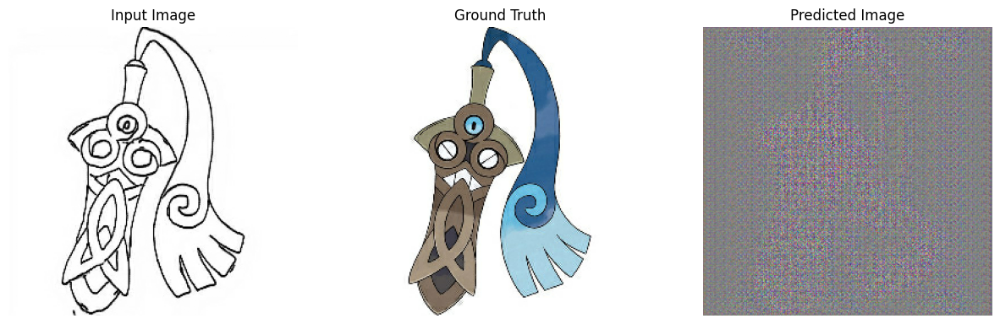

In [52]:
def generate_images(model, test_input, tar):

    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))    
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']  

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])

        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')

    plt.show()

# Test the above function
for example_input, example_target in test_dataset.take(1):
    generate_images(gen_model, example_input, example_target)

# **LOAD TENSORBOARD**

In [53]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Clear any logs from previous runs
!rm -rf ./logs/ 

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# **TRAINING**

In [54]:
log_dir = "logs/"

current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = log_dir + 'gradient_tape/' + current_time + '/train'

################# FOR USE WITH GOOGLE DRIVE #################

# Define a path to folder in Google Drive
my_drive_path = '/content/drive/My Drive/colab/hons_ML/' + train_log_dir

# If this folder already exists, it wont create a new one
if not os.path.exists(my_drive_path):
    os.makedirs(my_drive_path)

################# FOR USE WITH GOOGLE DRIVE END #############

train_summary_writer = tf.summary.create_file_writer(train_log_dir)

# Create a CSV writer object for Generator losses
csv_file_gen = open('generator_loss_values.csv', 'w', newline='')
csv_writer_gen = csv.writer(csv_file_gen)
# Write the header row
csv_writer_gen.writerow(['Step', 'Gen Total Loss', 'Gen GAN Loss', 'Gen L1 Loss', 'Gen Content Loss', 'Gen Style Loss'])

# Create a CSV writer object for Discriminator losses
csv_file_disc = open('discriminator_loss_values.csv', 'w', newline='')
csv_writer_disc = csv.writer(csv_file_disc)
# Write the header row
csv_writer_disc.writerow(['Step', 'Dis Total Loss', 'Dis Real Loss', 'Dis Generated Loss', 'Dis Content Loss', 'Dis Style Loss'])

# Define metrics for avgeraging local losses after each step
generator_total_loss_metric = tf.keras.metrics.Mean(name='generator_total_loss')
generator_gan_loss_metric = tf.keras.metrics.Mean(name='generator_gan_loss')
generator_l1_loss_metric = tf.keras.metrics.Mean(name='generator_l1_loss')
generator_content_loss_metric = tf.keras.metrics.Mean(name='generator_content_loss')
generator_style_loss_metric = tf.keras.metrics.Mean(name='generator_style_loss')

discriminator_total_loss_metric = tf.keras.metrics.Mean(name='discriminator_total_loss')
discriminator_real_loss_metric = tf.keras.metrics.Mean(name='discriminator_real_loss')
discriminator_generated_loss_metric = tf.keras.metrics.Mean(name='discriminator_generated_loss')
discriminator_content_loss_metric = tf.keras.metrics.Mean(name='discriminator_content_loss')
discriminator_style_loss_metric = tf.keras.metrics.Mean(name='discriminator_style_loss')

# Decalred in global scope for printing use in fit function
# Updated in training function
gen_total_loss = 0
gen_gan_loss = 0
gen_l1_loss = 0
gen_content_loss = 0
gen_style_loss = 0

disc_total_loss = 0
disc_real_loss = 0
disc_generated_loss = 0
disc_style_loss = 0
disc_content_loss = 0

#@tf.function
def train_step(in_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_model_output = gen_model(in_image, training=True)

        # Pass the input sketch and ground truth
        disc_real_output = disc_model([in_image, target], training=True)

        disc_generated_output = disc_model([in_image, gen_model_output], training=True) # (1, 16, 16, 1)

        # Params:
        # disc_generated_output = input tensor to be split into a content image and style vector
        # 1 = number of input channels of the disc_generated_output input tensor
        # 256 = the number of output channels of the style vector, this must match the spatial dimensions of the original style image
        # so that a style loss can be calcualted in the G loss function between the style image and the returned style vector
        # C(I)                      S(I)
        predicted_sketch_gen, predicted_style_gen = idn(disc_generated_output, 1, 256, content_channel=1)   # Used in the Gen losses
        predicted_sketch_real, _ = idn(in_image, 3, 256)             # Predicting a content sketch from the input image, needed for the Disc losses
        _, predicted_style_real = idn(style_image, 3, 256)          # Predicting style vector from the original style image, needed for the Disc losses

        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_content_loss, gen_style_loss = updated_generator_loss(disc_generated_output,
                                                                                                     gen_model_output,
                                                                                                     target,
                                                                                                     in_image,
                                                                                                     predicted_sketch_gen,
                                                                                                     predicted_style_gen)

        disc_total_loss, disc_real_loss, disc_generated_loss, disc_style_loss, disc_content_loss = updated_discriminator_loss(disc_real_output,
                                                                                                                      disc_generated_output,
                                                                                                                      target,
                                                                                                                      in_image,
                                                                                                                      predicted_style_real,
                                                                                                                      predicted_sketch_real)

    # Update local metrics
    generator_total_loss_metric.update_state(gen_total_loss)
    generator_gan_loss_metric.update_state(gen_gan_loss)
    generator_l1_loss_metric.update_state(gen_l1_loss)
    generator_content_loss_metric.update_state(gen_content_loss)
    generator_style_loss_metric.update_state(gen_style_loss)
    
    discriminator_total_loss_metric.update_state(disc_total_loss)
    discriminator_real_loss_metric.update_state(disc_real_loss)
    discriminator_generated_loss_metric.update_state(disc_generated_loss)
    discriminator_style_loss_metric.update_state(disc_style_loss)
    discriminator_content_loss_metric.update_state(disc_content_loss)

    # Calculate gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, gen_model.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_total_loss, disc_model.trainable_variables)

    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, gen_model.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc_model.trainable_variables))

    # Print losses and save them to CSV every 500 steps
    if (step) % 500 == 0:

        # Generator losses, print to Colab window
        template = 'Gen Total Loss:\t {:.3f},\t Gen GAN Loss:\t {:.3f},\t Gen L1 Loss:\t\t {:.3f},\t Gen Content Loss: {:.3f},\t\t Gen Style Loss:\t {:.3f}'
        print(template.format(gen_total_loss, gen_gan_loss, gen_l1_loss, gen_content_loss, gen_style_loss))

        # Get just the scalar value for the Tensor
        gen_total_loss_scalar = generator_total_loss_metric.result().numpy()
        gen_gan_loss_scalar = generator_gan_loss_metric.result().numpy()
        gen_l1_loss_scalar = generator_l1_loss_metric.result().numpy()
        gen_content_loss_scalar = generator_content_loss_metric.result().numpy()
        gen_style_loss_scalar = generator_style_loss_metric.result().numpy()
        
        # Output gen loss values to CSV
        csv_writer_gen.writerow([step.numpy().item() , gen_total_loss_scalar, gen_gan_loss_scalar, gen_l1_loss_scalar, gen_content_loss_scalar, gen_style_loss_scalar])

        # Discriminator losses, print to Colab window
        template = 'Dis Total Loss:\t {:.3f}, Dis Real Loss:\t {:.3f},\t Dis Generated Loss:\t {:.3f},\t Dis Content Loss: {:.3f},\t Dis Style Loss:\t {:.3f}'
        print(template.format(disc_total_loss, disc_real_loss, disc_generated_loss, disc_content_loss, disc_style_loss))

        disc_total_loss_scalar = discriminator_total_loss_metric.result().numpy()
        disc_real_loss_scalar = discriminator_real_loss_metric.result().numpy()
        disc_generated_loss_scalar = discriminator_generated_loss_metric.result().numpy()
        disc_content_loss_scalar = discriminator_content_loss_metric.result().numpy()
        disc_style_loss_scalar = discriminator_style_loss_metric.result().numpy()

        # Output disc loss values to CSV
        csv_writer_disc.writerow([step.numpy().item(), disc_total_loss_scalar, disc_real_loss_scalar, disc_generated_loss_scalar, disc_content_loss_scalar, disc_style_loss_scalar])

        print()

    # Write to Tensorboard
    with train_summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//10)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//10)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//10)
        tf.summary.scalar('gen_content_loss', gen_content_loss, step=step//10)
        tf.summary.scalar('gen_style_loss', gen_style_loss, step=step//10)

        tf.summary.scalar('disc_total_loss', disc_total_loss, step=step//10)
        tf.summary.scalar('disc_real_loss', disc_real_loss, step=step//10)
        tf.summary.scalar('disc_generated_loss', disc_generated_loss, step=step//10)
        tf.summary.scalar('disc_content_loss', disc_content_loss, step=step//10)
        tf.summary.scalar('disc_style_loss', disc_style_loss, step=step//10)

        #print("Error 11")
        # Note the removal of the floor division by 100 as it's not necessary as I want to log this summary scalar less frequently.
        #tf.summary.scalar('disc_generated_output prediction', disc_generated_output, step=step)

    ################# FOR USE WITH GOOGLE DRIVE #################

    # Copy the training log directory to Google Drive folder, all files done recursively using -r
    !cp -r "{train_log_dir}" "{my_drive_path}"

    ################# FOR USE WITH GOOGLE DRIVE END #############

# ACTUAL TRAINING
def fit(train_ds, test_ds, steps):

    # Get an image from the test set, sketch and ground truth
    test_ds_input, test_ds_target = next(iter(test_ds.take(1)))
    start = time.time()

    # Repeat the train data set indefinitely, for steps
    for step, (in_image, target) in train_ds.repeat().take(steps).enumerate():
        # Display an image every 1000 steps
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            # Start the clock again, for the next 1000 steps
            start = time.time()

            generate_images(gen_model, test_ds_input, test_ds_target)
            print(f"Steps Taken: {step//1000}k")
            print()

            # Shuffle the train_ds dataset every 1000 steps so that the next 1000 steps
            # of training are conducted over the same training data but in a different order
            train_ds = train_ds.shuffle(buffer_size=640)

        train_step(in_image, target, step)

        # Training step
        # if (step + 1) % 10 == 0:
        #     print('.', end='', flush=True)

        # Save (checkpoint) the model every 5000 steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# **RUN TRAINING LOOP**

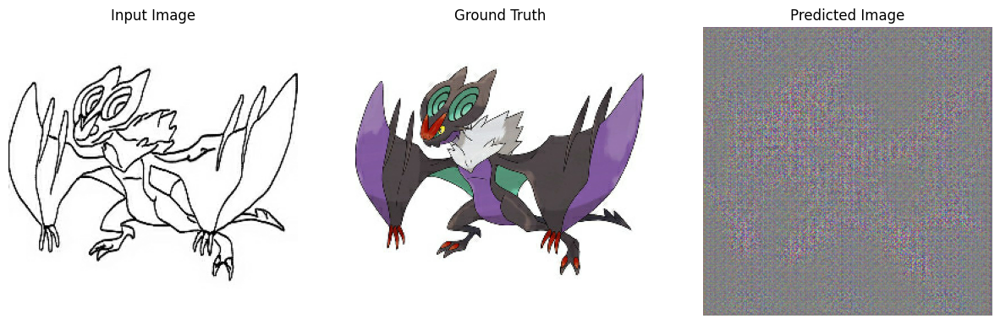

Steps Taken: 0k



Gen Total Loss:	 86.117,	 Gen GAN Loss:	 0.546,	 Gen L1 Loss:		 0.821,	 Gen Content Loss: 0.890,		 Gen Style Loss:	 2.592
Dis Total Loss:	 613.798, Dis Real Loss:	 0.562,	 Dis Generated Loss:	 1.202,	 Dis Content Loss: 1.031,	 Dis Style Loss:	 611.004



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
fit(train_dataset, test_dataset, steps=100)

csv_file_gen.close()
csv_file_disc.close()
files.download("generator_loss_values.csv")
files.download("discriminator_loss_values.csv")

# Replace filepath if loading from MyDrive or previous logs
# Navigate to train folder in "Files" sidebar, then right click and copy path
%tensorboard --logdir logs/gradient_tape

# **RESTORE LATEST CHECKPOINT AND TEST NETWORK**

In [ ]:
# !ls {checkpoint_dir}

# #Restoring the latest checkpoint in checkpoint_dir
# checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# **GENERATE IMAGES USING TEST SET**

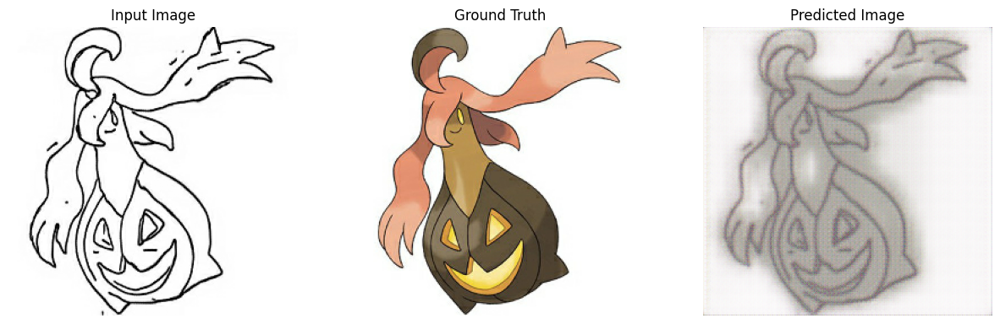

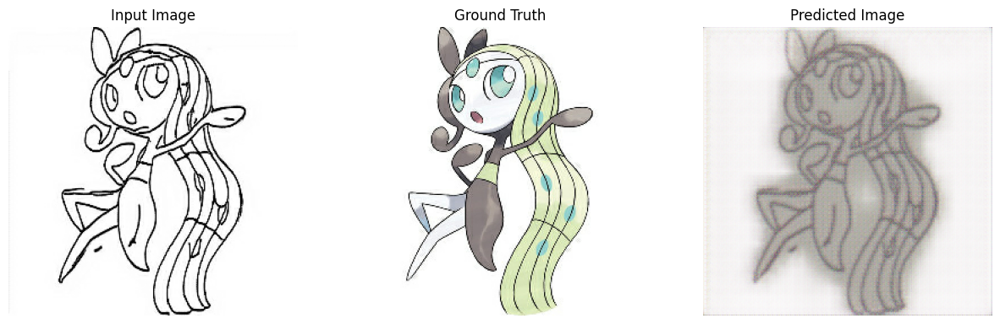

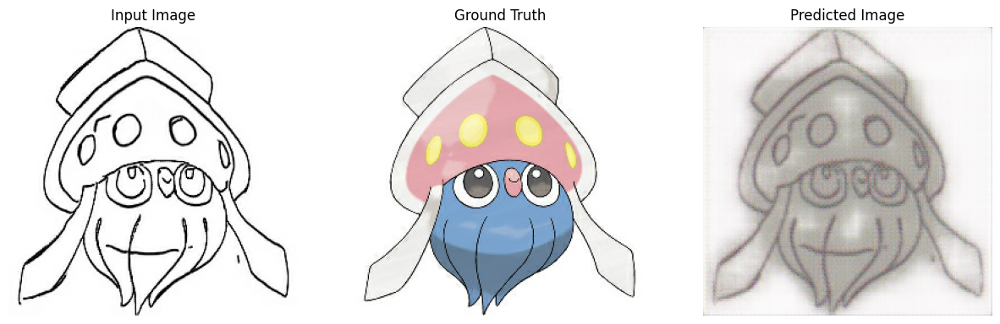

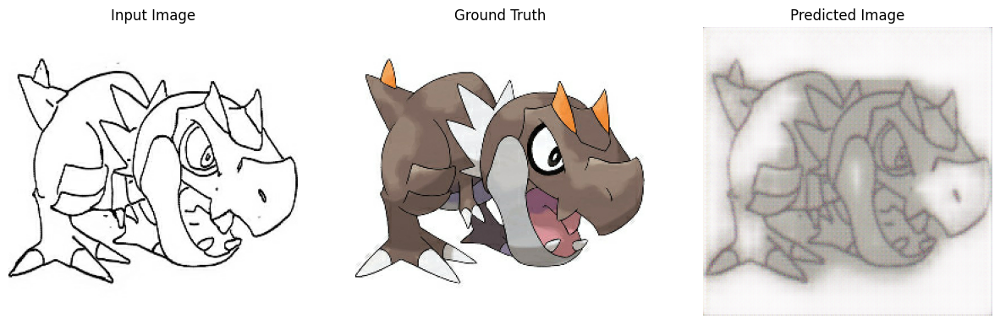

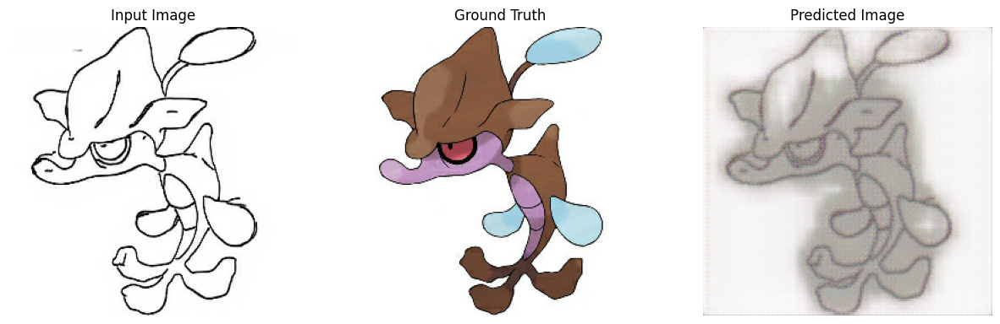

In [56]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
    generate_images(gen_model, inp, tar)